# Análisis de la métrica para el control orientado

In [1]:
# Importamos librerias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from highlight_text import ax_text, fig_text
from mplsoccer.pitch import Pitch
from statsbombpy import sb
import math
from collections import Counter
import networkx as nx
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
cols_types = pd.read_csv('features_types_control_or.csv')
cols_types.columns = ['feature', 'type']

In [4]:
cols_types['type'].value_counts()

type
object     101
float64     18
int64        8
Name: count, dtype: int64

In [3]:
# Create a dictionary from cols_types
dtype_dict = dict(zip(cols_types['feature'], cols_types['type']))
dtype_dict

{'50_50': 'object',
 'ball_receipt_outcome': 'object',
 'ball_recovery_offensive': 'object',
 'ball_recovery_recovery_failure': 'object',
 'block_deflection': 'object',
 'block_offensive': 'object',
 'carry_end_location': 'object',
 'clearance_aerial_won': 'object',
 'clearance_body_part': 'object',
 'clearance_head': 'object',
 'clearance_left_foot': 'object',
 'clearance_right_foot': 'object',
 'counterpress': 'object',
 'dribble_outcome': 'object',
 'dribble_overrun': 'object',
 'duel_outcome': 'object',
 'duel_type': 'object',
 'duration': 'float64',
 'foul_committed_advantage': 'object',
 'foul_committed_card': 'object',
 'foul_committed_type': 'object',
 'foul_won_advantage': 'object',
 'foul_won_defensive': 'object',
 'goalkeeper_body_part': 'object',
 'goalkeeper_end_location': 'object',
 'goalkeeper_outcome': 'object',
 'goalkeeper_position': 'object',
 'goalkeeper_technique': 'object',
 'goalkeeper_type': 'object',
 'id': 'object',
 'index': 'int64',
 'interception_outcome': 

In [ ]:
# Cargar los datos desde el archivo CSV
try:
    df = pd.read_csv('events_control_orientado_eur_masc_2024.csv', dtype=dtype_dict)
except FileNotFoundError:
    print("Error: El archivo CSV 'events_control_orientado_eur_masc_2024.csv' no se encuentra.")
    exit()

In [7]:
df.dtypes

50_50                    object
bad_behaviour_card       object
ball_receipt_outcome     object
block_deflection         object
block_save_block         object
                         ...   
y                       float64
pass_end_location_x     float64
pass_end_location_y     float64
continuous_timestamp    float64
control_quality         float64
Length: 126, dtype: object

In [8]:
df['seconds_timestamp'] = df['minute']*60 + df['second']
df[['seconds_timestamp', 'minute', 'second', 'period']]

,seconds_timestamp,minute,second,period
0,0,0,0,1
1,0,0,0,1
2,0,0,0,1
3,0,0,0,1
4,2700,45,0,2
...,...,...,...,...
187853,4802,80,2,2
187854,4854,80,54,2
187855,4061,67,41,2
187856,5192,86,32,2


In [9]:
# Filtrar pases exitosos
successful_passes = df[
    (df['type'] == 'Pass') &
    (df['pass_outcome'].isnull()) &
    (df['play_pattern']!= 'From Corner' ) 
].copy()

In [11]:
df[['timestamp', 'minute', 'second', 'period','continuous_timestamp']].dtypes

timestamp                object
minute                    int64
second                    int64
period                    int64
continuous_timestamp    float64
dtype: object

In [5]:
df['control_quality'].describe()

count    43892.000000
mean         0.171234
std          0.055472
min          0.008907
25%          0.133806
50%          0.172084
75%          0.209074
max          0.606710
Name: control_quality, dtype: float64

In [16]:
# Valores faltantes
df.isnull().sum()

50_50                   187565
bad_behaviour_card      187800
ball_receipt_outcome    181582
block_deflection        187789
block_save_block        187851
                         ...  
pass_end_location_x     133968
pass_end_location_y     133968
continuous_timestamp         0
control_quality         143966
seconds_timestamp            0
Length: 127, dtype: int64

In [17]:
# Filas vacias
df.dropna().shape

(0, 127)

No hay filas vacias, simplemente columnas vacias. Tiene sentido ya que si ocurrie cierto evento, otros eventos o caracteristicas relacionadas con otros eventos no tendran valor

In [18]:
# Filas duplicadas
df.duplicated().sum()

np.int64(0)

No hay filas duplicadas

       control_quality  num_rivals_nearby              x              y
count     43892.000000       43892.000000  186190.000000  186190.000000
mean          0.171234           0.097284      58.978079      39.864701
std           0.055472           0.348825      28.961843      23.103241
min           0.008907           0.000000       0.100000       0.100000
25%           0.133806           0.000000      37.200000      20.000000
50%           0.172084           0.000000      59.400000      39.900000
75%           0.209074           0.000000      80.900000      59.600000
max           0.606710           5.000000     120.100000      80.000000


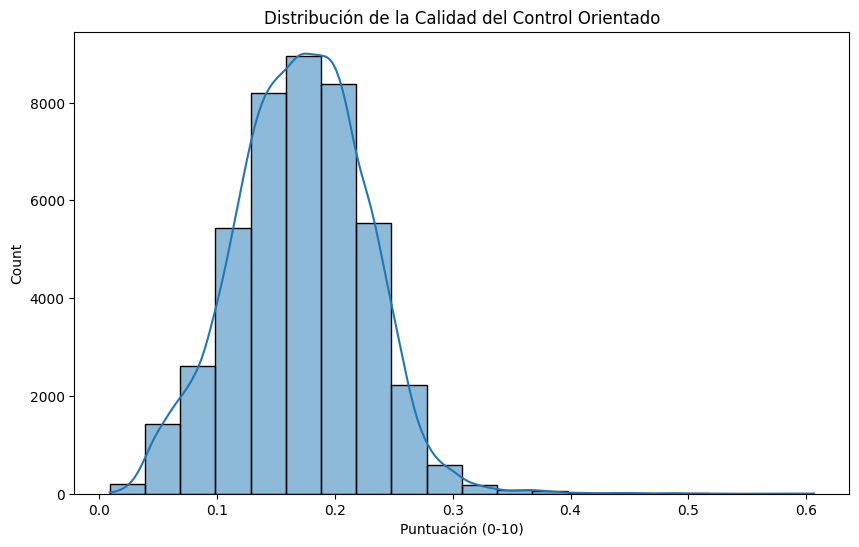

In [19]:
print(df[['control_quality', 'num_rivals_nearby', 'x', 'y']].describe())

# Distribución de la métrica de control
plt.figure(figsize=(10, 6))
sns.histplot(df['control_quality'], bins=20, kde=True)
plt.title("Distribución de la Calidad del Control Orientado")
plt.xlabel("Puntuación (0-10)")
plt.show()


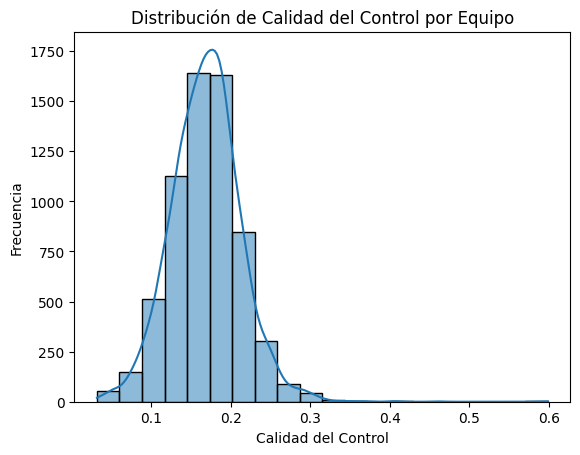

In [23]:
# Distribucion control_quality por equipo
control_quality_by_team = df.groupby(['possession', 'match_id'])['control_quality'].mean()
sns.histplot(control_quality_by_team, bins=20, kde=True)
plt.title("Distribución de Calidad del Control por Equipo")
plt.xlabel("Calidad del Control")
plt.ylabel("Frecuencia")
plt.show()

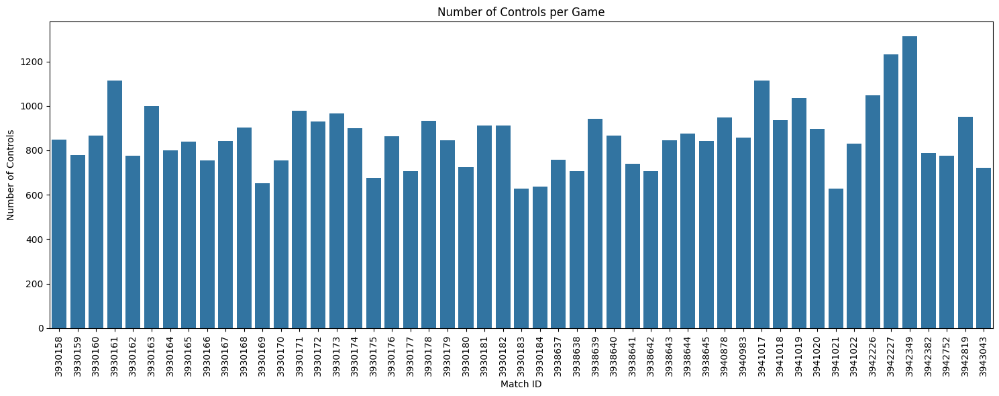

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the number of control events per game
controls_per_game = df.groupby('match_id')['control_quality'].count()

# Create a bar plot to show the number of controls for each game
plt.figure(figsize=(15, 6))  # Adjust figure size for better visibility
sns.barplot(x=controls_per_game.index, y=controls_per_game.values)
plt.title("Number of Controls per Game")
plt.xlabel("Match ID")
plt.ylabel("Number of Controls")
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

Text(0.5, 1.0, 'Top 10 Teams by Average Control Quality')

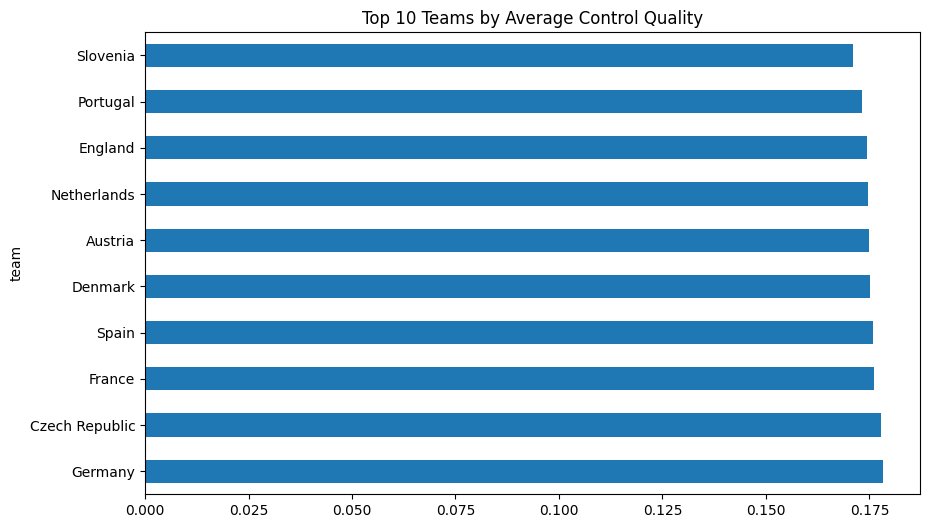

In [21]:
df.groupby([ 'team'])['control_quality'].mean().sort_values(ascending=False).head(10).plot(kind='barh', figsize=(10, 6))
plt.title("Top 10 Teams by Average Control Quality")

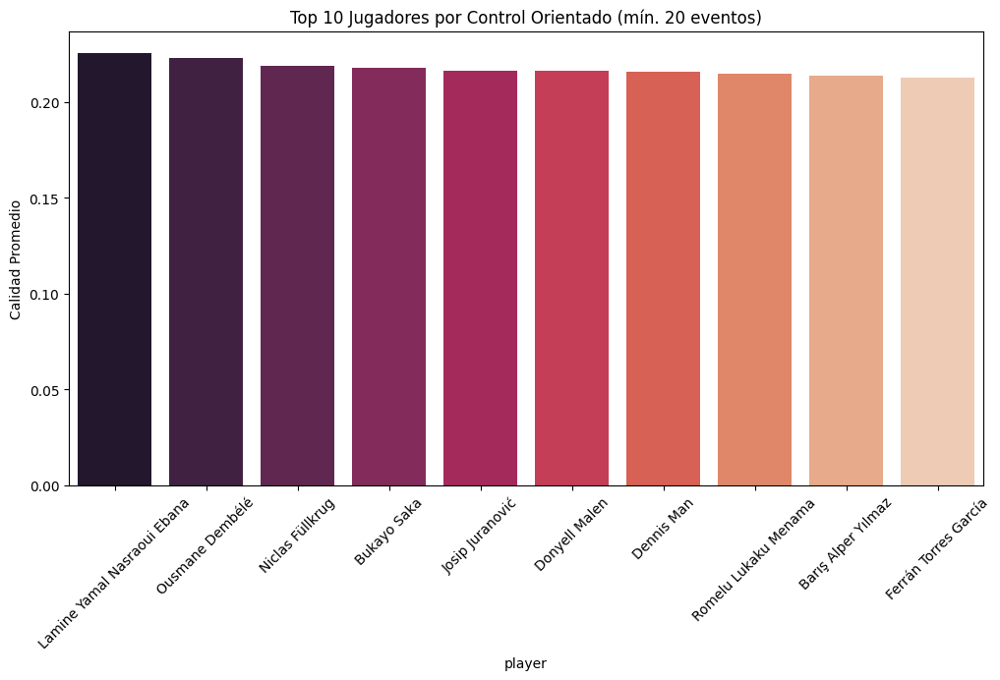

In [25]:
# Top 10 jugadoras con mejor control orientado
top_players = df.groupby('player')['control_quality'].agg(['mean', 'count'])
top_players = top_players[top_players['count'] > 20].sort_values('mean', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(
    x=top_players.index,
    y=top_players['mean'],
    palette='rocket'
)
plt.xticks(rotation=45)
plt.title("Top 10 Jugadores por Control Orientado (mín. 20 eventos)")
plt.ylabel("Calidad Promedio")
plt.show()


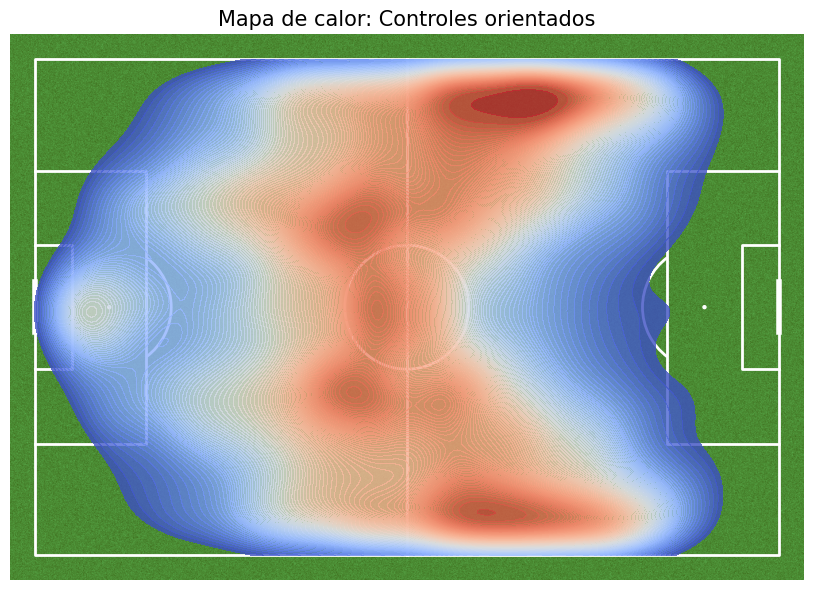

In [ ]:
# Filtramos controles orientados positivos
positive_controls = df[df['control_quality'].notna()]

# Crear el campo
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(10, 6))

# Extraer las posiciones de los controles orientados
x=positive_controls['pass_end_location_x']
y=positive_controls['pass_end_location_y']

# Crear el mapa de calor
pitch.kdeplot(
    x, y, ax=ax, shade=True, cmap='coolwarm', levels=100, alpha=0.8
)
ax.set_title('Mapa de calor: Controles orientados', fontsize=15)
plt.show()

In [27]:
df['field_zone'] = pd.cut(df['distance_to_attacking_goal'],
                                           bins=[0, 40, 80, 120],
                                           labels=['Offensive', 'Middle', 'Defensive'])

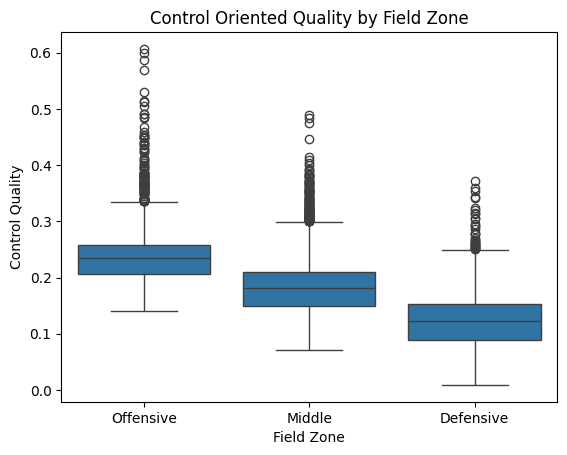

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribución de calidad por zonas del campo
sns.boxplot(data=df, x='field_zone', y='control_quality')
plt.title('Control Oriented Quality by Field Zone')
plt.xlabel('Field Zone')
plt.ylabel('Control Quality')
plt.show()

Calculamos acciones siguientes al control orientado

In [35]:
print(df['timestamp'].dtype)

object


In [36]:
successful_passes['pass_goal_assist'].value_counts()

pass_goal_assist
True    61
Name: count, dtype: int64

In [37]:
successful_passes['pass_goal_assist'].notna().sum()

np.int64(61)

In [38]:
def subsequent_action_improved(row, events, time_threshold=5.0):
    """Evalúa la acción posterior al pase con criterios más flexibles."""
    # Verificaciones básicas
    if pd.isna(row['continuous_timestamp']) or pd.isna(row['match_id']) or pd.isna(row['pass_recipient']):
        return 'Invalid_Data'

    if row['type'] == 'Pass':
        if row['pass_goal_assist']== 'True':
            return 'Goal_Assist'
        elif row['pass_shot_assist']== 'True':
            return 'Shot_Assist'
        elif row['pass_cross']== 'True':
            return 'Cross'
        elif row['pass_through_ball']== 'True':
            return 'Through_Ball'

    # Extraer valores clave
    seconds_timestamp = row['seconds_timestamp']
    match_id = row['match_id']
    team = row['team']
    period = row['period']
    recipient = row['pass_recipient']
    possession = row['possession']

    # Obtener coordenadas de destino del pase
    try:
        if isinstance(row['pass_end_location'], str):
            pass_end_location = eval(row['pass_end_location'])
        else:
            pass_end_location = row['pass_end_location']
        pass_end_x = pass_end_location[0]
    except (TypeError, ValueError, SyntaxError):
        pass_end_x = None

    
    seconds_timestamp_mas = seconds_timestamp + time_threshold

    subsequent_events = events[
        (events['match_id'] == match_id) &
        (events['possession'] == possession) &  # Mantener en misma posesión
        (events['period']==period) &  # Mantener en el mismo periodo
        (events['seconds_timestamp'] > seconds_timestamp) & (events['seconds_timestamp'] <= seconds_timestamp_mas) # Buscar eventos dentro del umbral de tiempo
        ].sort_values('seconds_timestamp')
    

    # CAMBIO PRINCIPAL 3: Priorizar eventos del receptor pero considerar otros
    recipient_events = subsequent_events[(subsequent_events['player'] == recipient) & 
                        (subsequent_events['type']!='Ball Receipt*') & (subsequent_events['type']!='Carry')]

    if not recipient_events.empty:
        if len(recipient_events) > 0:
            first_event = recipient_events.iloc[0]
        else:
            return 'No_Subsequent_Action'
    elif not subsequent_events.empty:
        if len(subsequent_events) > 0:
            first_event = subsequent_events.iloc[0]
        else:
            return 'No_Subsequent_Action'
    else:
        return 'No_Subsequent_Action'

    # Clasificar la acción
    action_type = first_event['type']

    if action_type == 'Pass':
        if first_event.get('pass_goal_assist')== 'True':
            return 'Pre_Goal_Assist'
        elif first_event.get('pass_shot_assist')== 'True':
            return 'Pre_Shot_Assist'
        elif first_event.get('pass_cross')== 'True':
            return 'Next_Cross'
        elif pass_end_x is not None and first_event.get('x') is not None:
            return 'Forward_Pass' if first_event['x'] >= pass_end_x else 'Backward_Pass'
        else:
            return 'Next_Pass'
    elif action_type == 'Shot':
        if first_event.get('shot_outcome') == 'Goal':
            return 'Goal'
        else:
            return 'Shot'
    elif action_type == 'Ball Receipt':
        return 'Control'
    elif action_type == 'Dribble':
        return 'Dribble'
    elif action_type == 'Carry':
        return 'Carry'
    elif action_type == 'Duel':
        return 'Duel'
    else:
        return action_type  # Return the actual action type


In [40]:
print('Balones controlados que no tienen accion siguiente: ',df[df['type']=='Ball Receipt*']['ball_receipt_outcome'].notna().sum())
print('Balones controlados con accion siguiente: ',df[df['type']=='Ball Receipt*']['ball_receipt_outcome'].isna().sum())
print('Pases con accion siguiente: ',df[df['type']=='Pass']['pass_outcome'].isna().sum())
print('Pases realizados en juego normal (sin balon parado): ',df[(df['play_pattern']== 'Regular Play') & (df['type']=='Pass')].shape[0])
print('Pases realizados en juego normal con accion siguiente: ', df[(df['play_pattern']== 'Regular Play') & (df['type']=='Pass') & (df['pass_outcome'].isna())].shape[0])
print('Numero de controles orientados: ', df['control_quality'].notna().sum())
print('Shape successful_passes: ', successful_passes.shape[0])

Balones controlados que no tienen accion siguiente:  6276
Balones controlados con accion siguiente:  45342
Pases con accion siguiente:  45378
Pases realizados en juego normal (sin balon parado):  20841
Pases realizados en juego normal con accion siguiente:  18139
Numero de controles orientados:  43892
Shape successful_passes:  43892


Vemos que la cantidad de pases con accion siguiente es la misma que el numero de controles orientados, un poco menos de la mitad del total de pases con accion siguiente.

In [41]:
successful_passes['seconds_timestamp'].isna().sum()

np.int64(0)

In [42]:
truest = successful_passes[successful_passes['pass_goal_assist'].notna()]['pass_goal_assist']
truest[truest == 'True']

1047      True
3989      True
4239      True
4386      True
6908      True
          ... 
181626    True
181853    True
184626    True
184750    True
185489    True
Name: pass_goal_assist, Length: 61, dtype: object

In [43]:
df[(df['type']!='Ball Receipt*') & (df['type']!='Carry')].iloc[0]

50_50                   NaN
bad_behaviour_card      NaN
ball_receipt_outcome    NaN
block_deflection        NaN
block_save_block        NaN
                       ... 
pass_end_location_y     NaN
continuous_timestamp    0.0
control_quality         NaN
seconds_timestamp         0
field_zone              NaN
Name: 0, Length: 128, dtype: object

In [44]:
successful_passes[successful_passes['pass_goal_assist']==True]

,50_50,bad_behaviour_card,ball_receipt_outcome,block_deflection,block_save_block,carry_end_location,clearance_aerial_won,clearance_body_part,clearance_head,clearance_left_foot,...,teammates_positions,distance_to_attacking_goal,distance_to_defending_goal,x,y,pass_end_location_x,pass_end_location_y,continuous_timestamp,control_quality,seconds_timestamp


Vemos que algunas variables booleanas no las coge bien, porque detecta los valores como strings.

In [ ]:
# 2. Aplicar la función a successful_passes, pero usando el dataset entero (df) para contexto
successful_passes['subsequent_action'] = successful_passes.apply(
    lambda row: subsequent_action_improved(row, df, time_threshold=5), axis=1
)

In [46]:
print(successful_passes['subsequent_action'].value_counts())
print('Pases con accion siguiente: ',successful_passes[successful_passes['subsequent_action'].notna()].shape[0])

subsequent_action
Forward_Pass            24391
Backward_Pass           10197
Ball Receipt*            4250
Miscontrol                772
Shot_Assist               757
Dribble                   729
Next_Cross                601
Dispossessed              600
Foul Won                  491
Pre_Shot_Assist           486
Cross                     136
Pressure                  132
No_Subsequent_Action      112
Goal_Assist                61
Pre_Goal_Assist            37
Half End                   29
Foul Committed             28
Through_Ball               23
Carry                      13
Ball Recovery              10
Block                       7
Injury Stoppage             7
50/50                       4
Clearance                   3
Duel                        3
Bad Behaviour               3
Tactical Shift              2
Interception                2
Error                       2
Shot                        2
Player On                   1
Goal                        1
Name: count, dtype: in

In [47]:
df['type'].unique()

array(['Starting XI', 'Half Start', 'Pass', 'Ball Receipt*', 'Carry',
       'Pressure', 'Miscontrol', 'Ball Recovery', 'Foul Committed',
       'Foul Won', 'Dribbled Past', 'Dribble', 'Block', 'Interception',
       'Duel', 'Goal Keeper', 'Clearance', 'Dispossessed', 'Shot',
       'Injury Stoppage', 'Player Off', 'Player On', 'Referee Ball-Drop',
       '50/50', 'Substitution', 'Tactical Shift', 'Half End',
       'Bad Behaviour', 'Shield', 'Error', 'Own Goal Against',
       'Own Goal For', 'Offside'], dtype=object)

Vemos que la cantidad de no subsequent action es muy parecida a la cantidad de ball receipt outcome que no tienen accion siguiente, lo cual tiene sentido

No hay acciones siguientes que sean gol o tiro, ya que ya se recogen en Shot_Assist y Goal_Assist

In [48]:
print(successful_passes[successful_passes['subsequent_action']=='Shot'].shape[0])
print(successful_passes[successful_passes['subsequent_action']=='Shot_Assist'].shape[0])
print(successful_passes[successful_passes['subsequent_action']=='Goal'].shape[0])
print(successful_passes[successful_passes['subsequent_action']=='Goal_Assist'].shape[0])

2
757
1
61


In [49]:
print(df[df['play_pattern']!='From Corner']['pass_goal_assist'].value_counts())
print(df[(df['play_pattern']!='From Corner') & (df['type']=='Shot')]['shot_outcome'].value_counts())
# print(df[(df['play_pattern']=='From Throw In') & (df['type']=='Shot')]['shot_outcome'].value_counts())

pass_goal_assist
True    61
Name: count, dtype: int64
shot_outcome
Off T               320
Blocked             313
Saved               285
Goal                111
Wayward              62
Post                 19
Saved to Post         5
Saved Off Target      3
Name: count, dtype: int64


Vemos que hay 140 goles de jugada normal en toda la competicion, de los cuales 79 vienen precedidos de un pase, el resto pueden haberse debido a un rebote o jugada individual

In [51]:
print(successful_passes['subsequent_action'].dtype)
successful_passes['subsequent_action'].astype('string')
print(successful_passes['subsequent_action'].dtype)

object
object


In [ ]:
# Actualizar el df original con las nuevas acciones siguientes
if 'subsequent_action' in df.columns:
    df = df.drop('subsequent_action', axis=1)
df = df.merge(
    successful_passes[['id', 'subsequent_action']], on='id', how='left'
)

In [ ]:
# df.to_csv('subs_events_eur24.csv', index=False)

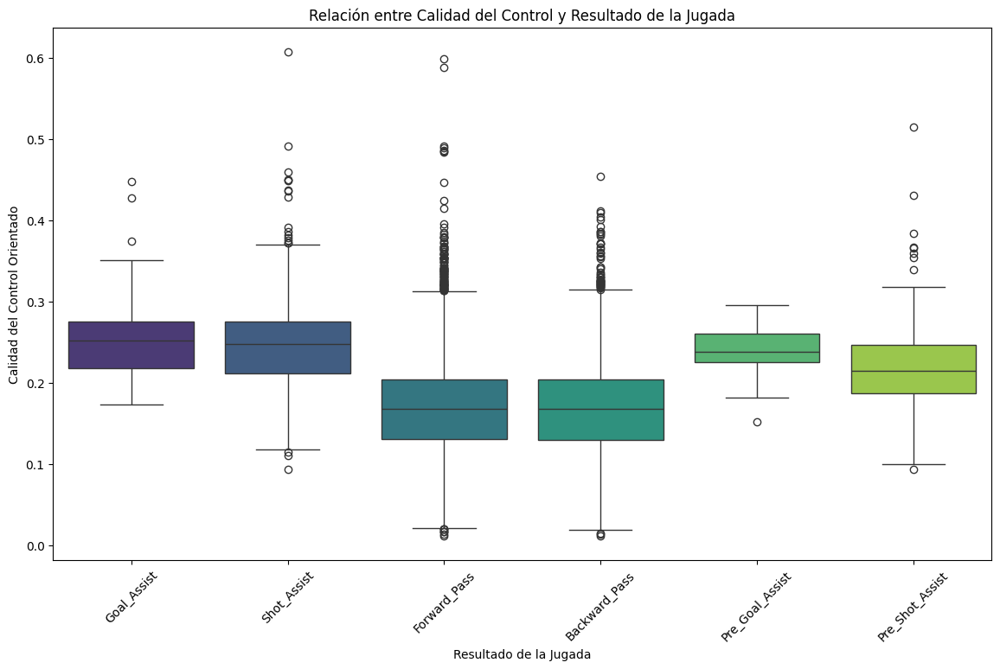

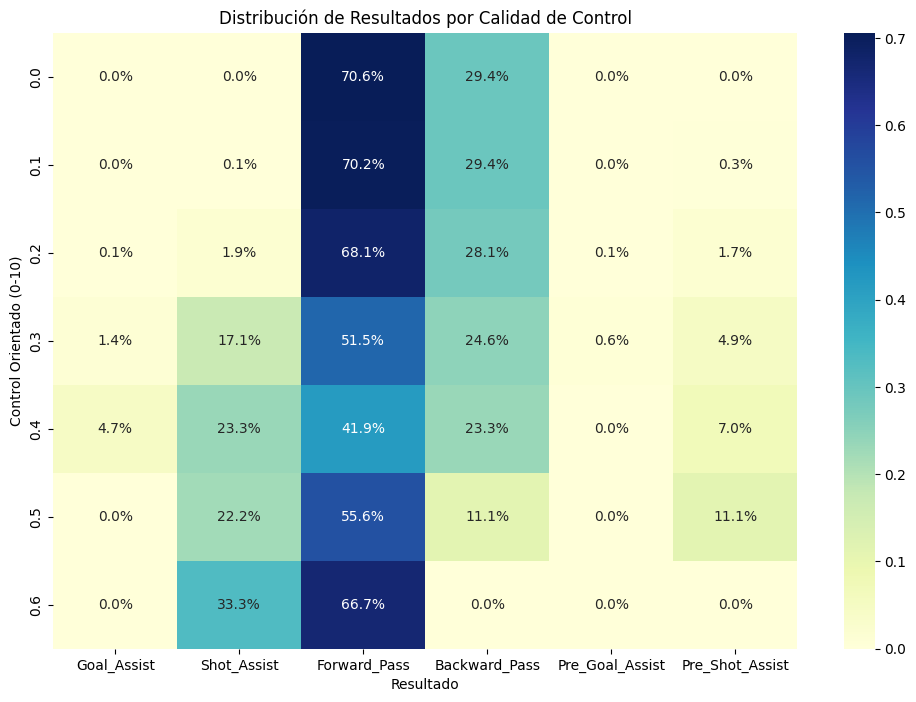

In [ ]:
# Análisis de relación entre control y resultado
relevant_actions = ['Goal_Assist', 'Shot_Assist', 'Forward_Pass', 'Backward_Pass', 'Pre_Goal_Assist', 'Pre_Shot_Assist']
filtered_df = df[df['subsequent_action'].isin(relevant_actions)]

plt.figure(figsize=(14, 8))
sns.boxplot(
    x='subsequent_action',  
    y='control_quality',
    data=filtered_df,  
    order=relevant_actions,  
    palette='viridis'
)

plt.title("Relación entre Calidad del Control y Resultado de la Jugada")
plt.xlabel("Resultado de la Jugada")
plt.ylabel("Calidad del Control Orientado")
plt.xticks(rotation=45)
plt.show()

# 3. Tabla de contingencia
cross_tab = pd.crosstab(
    index=filtered_df['control_quality'].round(1),  
    columns=filtered_df['subsequent_action'], 
    values=filtered_df['subsequent_action'],  
    aggfunc='count',
    normalize='index'
)

cross_tab = cross_tab.loc[:, relevant_actions] 


plt.figure(figsize=(12, 8))
sns.heatmap(cross_tab, annot=True, cmap='YlGnBu', fmt=".1%")
plt.title("Distribución de Resultados por Calidad de Control")
plt.xlabel("Resultado")
plt.ylabel("Control Orientado (0-10)")
plt.show()

Se ve que los controles con mayor valor son aquellos para tiros y pases hacia delante (aunque muy atipicos). En cambio los controles que llevan a goles son valores medio altos pero no tanto, serían controles 'mas sencillos'. Algo que cabe señalar es la calidad de los controles de las asistencias

Vemos como aumenta mucho las desviaciones respecto a la media a medida que aumenta la calidad.

## Secuencia pases: 
Pases del mismo equipo en el mismo partido que pertenezcan a la misma posesion, y verificando que el jugador que recibe el pase del ultimo pase guardado de la secuencia es el que ejecuta la accion siguiente, que si no es un pase, se acaba ahi, guardando el tipo de esa accion si es gol o no.

In [ ]:
posesiones = [grupo for (match_id, possession), grupo in df.groupby(['match_id', 'possession'])]

In [80]:
secuencias = []
secuencia_id = 0
pase_id_global = 0
# Agrupar por partido y posesión
# Ordenar por partido, posesión y tiempo
# df_sorted = df.sort_values(by=['match_id', 'possession', 'timestamp']).reset_index(drop=True)

for (match_id, possession), grupo in df.groupby(['match_id', 'possession']):
    grupo = grupo.reset_index(drop=True)
    equipo_actual = grupo.iloc[0]['team']
    
    secuencia = []
    
    for i in range(len(grupo)):
        evento = grupo.iloc[i]
        if evento['team'] != equipo_actual:
            continue  # Solo nos interesa la posesión del equipo

        if evento['type'] == 'Pass':
            if len(secuencia) == 0 or secuencia[-1]['pass_recipient'] == evento['player']:
                secuencia.append(evento)
            else:
                break  # Se rompe la cadena si no sigue la secuencia de pases
        else:
            if len(secuencia) == 0:
                continue 
            if secuencia[-1]['subsequent_action'] =='Goal_Assist':
                gol = 1
            else:
                gol = 0
            # resultado_final = evento['subsequent_action']
            for i,pase in enumerate(secuencia):
                secuencias.append({
                    'match_id': match_id,
                    'possession': possession,
                    'secuencia_id': secuencia_id,
                    'pase_id': pase_id_global,
                    'pase_orden': i,
                    'player': pase['player'],
                    'recipient': pase['pass_recipient'],
                    'timestamp': pase['timestamp'],
                    'period': pase['period'],
                    'control_orientado': pase['control_quality'],
                    'posicion_control' : pase['pass_end_location'],
                    'resultado': pase['subsequent_action'],
                    'gol': gol
                })
                pase_id_global += 1
            secuencia_id += 1
            break  # terminamos esta posesión


In [ ]:
# df.to_csv('sub_action_eur_masc_2024.csv', index=False)

In [81]:
df_secuencias = pd.DataFrame(secuencias)
df_secuencias

,match_id,possession,secuencia_id,pase_id,pase_orden,player,recipient,timestamp,period,control_orientado,posicion_control,resultado,gol
0,3930158,3,0,0,0,Angus Gunn,Anthony Ralston,1900-01-01 00:01:35.933,1,NaN,"[95.9, 66.8]",NaN,0
1,3930158,4,1,1,0,Jamal Musiala,Florian Wirtz,1900-01-01 00:01:42.543,1,0.188745,"[63.6, 13.4]",Forward_Pass,0
2,3930158,4,1,2,1,Florian Wirtz,Jamal Musiala,1900-01-01 00:01:47.194,1,0.222840,"[97.6, 9.0]",Dribble,0
3,3930158,6,2,3,0,Ryan Porteous,Che Adams,1900-01-01 00:02:47.322,1,0.195982,"[77.7, 74.5]",Forward_Pass,0
4,3930158,6,2,4,1,Che Adams,John McGinn,1900-01-01 00:02:48.818,1,0.203176,"[86.0, 70.1]",Miscontrol,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28980,3943043,144,5389,28980,0,Marc Guehi,Declan Rice,1900-01-01 00:46:59.149,2,0.166369,"[46.2, 37.7]",Forward_Pass,0
28981,3943043,144,5389,28981,1,Declan Rice,Ivan Toney,1900-01-01 00:47:00.938,2,NaN,"[72.2, 52.4]",NaN,0
28982,3943043,145,5390,28982,0,Cole Palmer,Marc Guehi,1900-01-01 00:47:12.613,2,0.214231,"[63.1, 37.4]",Foul Won,0
28983,3943043,146,5391,28983,0,Jordan Pickford,Ivan Toney,1900-01-01 00:47:40.833,2,NaN,"[105.8, 59.0]",NaN,0


In [ ]:
# df_secuencias.to_csv('secuencias_eur_masc_2024.csv', index=False)

In [82]:
print(successful_passes.shape)
print(df_secuencias.shape)
print(df_secuencias['resultado'].value_counts())
print(df_secuencias['gol'].value_counts())
# print(df_secuencias['pase_id'].nunique()) 


(43892, 128)
(28985, 13)
resultado
Forward_Pass            14135
Backward_Pass            5790
Ball Receipt*            2563
Shot_Assist               427
Miscontrol                416
Dribble                   402
Foul Won                  381
Dispossessed              283
Pre_Shot_Assist           277
Next_Cross                272
No_Subsequent_Action       75
Pressure                   70
Cross                      57
Goal_Assist                41
Pre_Goal_Assist            27
Foul Committed             16
Half End                   14
Through_Ball               11
Ball Recovery               5
Carry                       3
Injury Stoppage             3
Tactical Shift              1
Goal                        1
Interception                1
Block                       1
Duel                        1
50/50                       1
Error                       1
Bad Behaviour               1
Name: count, dtype: int64
gol
0    28684
1      301
Name: count, dtype: int64


In [83]:
print(df_secuencias['resultado'].isna().sum())
print(df_secuencias.shape)

3709
(28985, 13)


In [86]:
df_secuencias.columns

Index(['match_id', 'possession', 'secuencia_id', 'pase_id', 'pase_orden',
       'player', 'recipient', 'timestamp', 'period', 'control_orientado',
       'posicion_control', 'resultado', 'gol'],
      dtype='object')

In [126]:
# Filtrar las secuencias que terminaron en gol
secuencias_gol = [s for s in secuencias if s['gol'] == 1]
secuencias_no_gol = [s for s in secuencias if s['gol'] == 0]

# Extraer posiciones y valores de control orientado
posiciones_control = [
    (s['player'], s['recipient'], s['timestamp'], s['control_orientado'])
    for s in secuencias_gol
]

# Mostrar resultados
for jugador, receptor, tiempo, control in posiciones_control:
    print(f"Jugador: {jugador}, Receptor: {receptor}, Timestamp: {tiempo}, Control orientado: {control}")

Jugador: Manuel Neuer, Receptor: Jonathan Tah, Timestamp: 1900-01-01 00:45:51.804, Control orientado: 0.1284921117093792
Jugador: Jonathan Tah, Receptor: Pascal Groß, Timestamp: 1900-01-01 00:45:55.315, Control orientado: 0.1793815894162201
Jugador: Pascal Groß, Receptor: Maximilian Mittelstädt, Timestamp: 1900-01-01 00:45:58.343, Control orientado: 0.1899131838367208
Jugador: Maximilian Mittelstädt, Receptor: Pascal Groß, Timestamp: 1900-01-01 00:46:01.975, Control orientado: 0.1334330116625441
Jugador: Pascal Groß, Receptor: Antonio Rüdiger, Timestamp: 1900-01-01 00:46:04.573, Control orientado: 0.1612885278340638
Jugador: Antonio Rüdiger, Receptor: Leroy Sané, Timestamp: 1900-01-01 00:46:07.345, Control orientado: 0.1773920353929701
Jugador: Leroy Sané, Receptor: Joshua Kimmich, Timestamp: 1900-01-01 00:46:09.344, Control orientado: 0.1991068055261727
Jugador: Joshua Kimmich, Receptor: Leroy Sané, Timestamp: 1900-01-01 00:46:14.594, Control orientado: 0.2616505788367418
Jugador: Ler

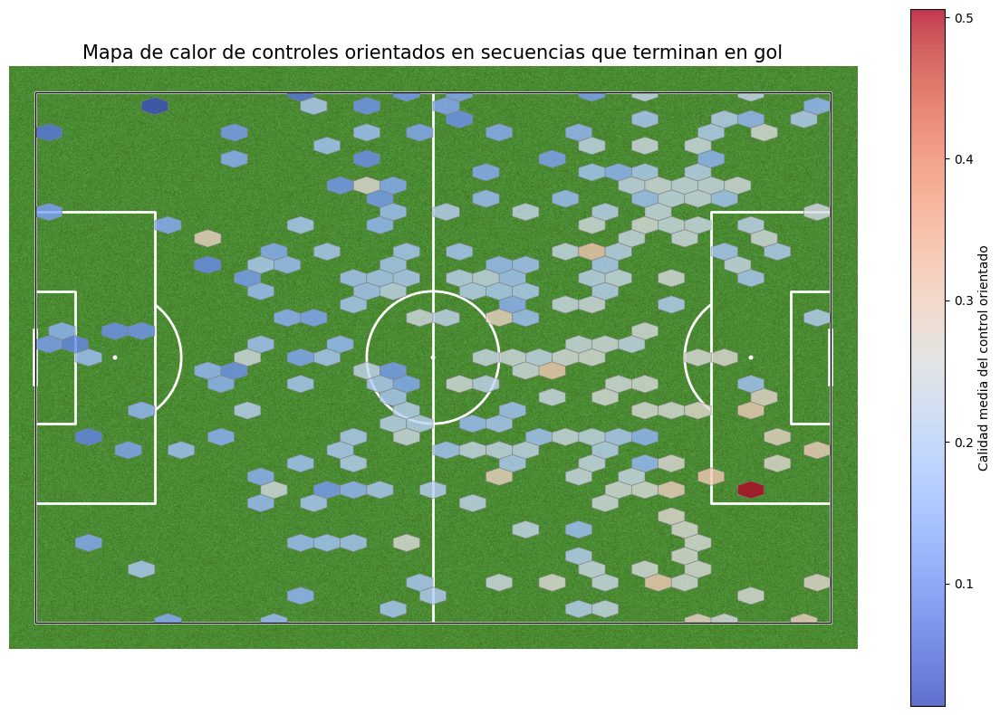

In [85]:
# Extraer controles de secuencias_gol con sus posiciones desde df
x, y, control = [], [], []
for s in secuencias_gol:
    # Busca el evento en df por match_id, timestamp y player
    evento = df[
        (df['match_id'] == s['match_id']) &
        (df['timestamp'] == s['timestamp']) &
        (df['player'] == s['player'])
    ]
    if not evento.empty:
        x_val = evento.iloc[0]['x']
        y_val = evento.iloc[0]['y']
        control_val = s['control_orientado']
        # Solo agrega si hay posición y control válido
        if pd.notnull(x_val) and pd.notnull(y_val) and pd.notnull(control_val):
            x.append(x_val)
            y.append(y_val)
            control.append(control_val)

# Crear el campo y el mapa de calor
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(12, 8))

hb = pitch.hexbin(
    x, y, ax=ax, gridsize=(30, 20), cmap='coolwarm',
    C=control, reduce_C_function=np.mean, edgecolors='grey', linewidths=0.5, alpha=0.8
)
cbar = plt.colorbar(hb, ax=ax)
cbar.set_label('Calidad media del control orientado')

ax.set_title('Mapa de calor de controles orientados en secuencias que terminan en gol', fontsize=15)
plt.show()

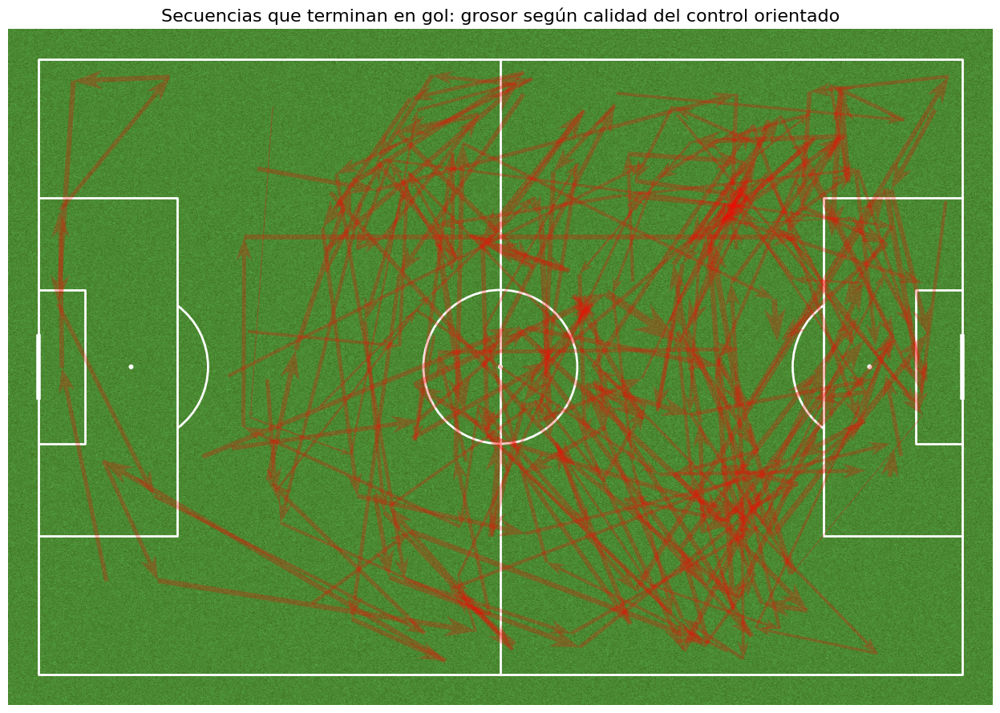

In [ ]:
# Graficar todas las secuencias que terminan en gol superpuestas en el mismo campo,
# con el grosor de cada flecha según la calidad del control orientado

# Normalizar la calidad del control para usar como grosor de línea
def normalize_control(control, min_width=1, max_width=8):
    # Si hay valores NaN, los reemplazamos por el mínimo
    control = np.nan_to_num(control, nan=np.nanmin(control))
    min_c, max_c = np.nanmin(control), np.nanmax(control)
    if max_c - min_c == 0:
        return np.full_like(control, min_width)
    return min_width + (control - min_c) / (max_c - min_c) * (max_width - min_width)

pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(14, 9))

# Extraer todos los valores de control para normalizar después
all_controls = [s['control_orientado'] for s in secuencias_gol if not np.isnan(s['control_orientado'])]
all_controls = np.array(all_controls)
# Normalizamos todos los valores de control
all_widths = normalize_control(all_controls)

# Para asignar grosor a cada pase, creamos un iterador de grosores
width_iter = iter(all_widths)

for secuencia in set((s['match_id'], s['possession'], s['secuencia_id']) for s in secuencias_gol):
    # Filtrar los pases de la secuencia
    pases = [s for s in secuencias_gol if (s['match_id'], s['possession'], s['secuencia_id']) == secuencia]
    # Ordenar por pase_orden
    pases = sorted(pases, key=lambda x: x['pase_orden'])
    for i in range(len(pases)-1):
        # Posición de control del pase actual
        pos_actual = pases[i]['posicion_control']
        if isinstance(pos_actual, str):
            try:
                pos_actual = eval(pos_actual)
            except Exception:
                continue
        # Posición de control del siguiente pase
        pos_siguiente = pases[i+1]['posicion_control']
        if isinstance(pos_siguiente, str):
            try:
                pos_siguiente = eval(pos_siguiente)
            except Exception:
                continue
        # Grosor según control orientado del pase actual
        control = pases[i]['control_orientado']
        if np.isnan(control):
            width = 1
        else:
            width = next(width_iter, 1)
        # Dibujar flecha
        pitch.arrows(
            pos_actual[0], pos_actual[1],
            pos_siguiente[0], pos_siguiente[1],
            ax=ax,
            color='red',
            alpha=0.25,
            width=width,
            headwidth=4,
            headlength=6,
            zorder=2
        )

ax.set_title('Secuencias que terminan en gol: grosor según calidad del control orientado', fontsize=16)
plt.show()

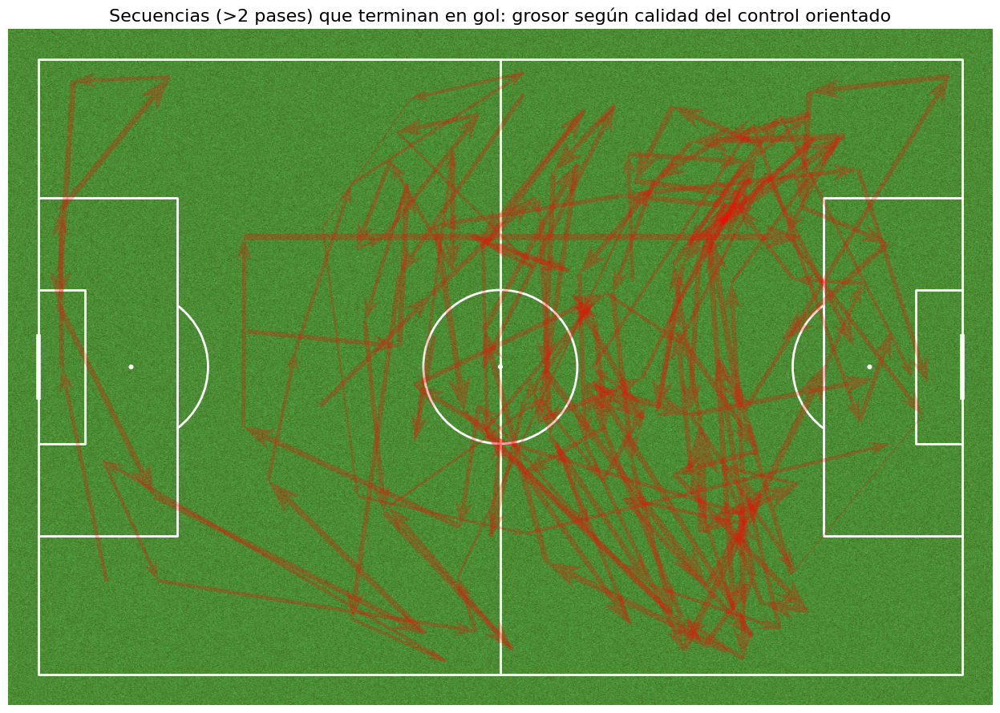

In [ ]:
# Filtrar secuencias con más de dos pases
secuencias_filtradas = []
for key in set((s['match_id'], s['possession'], s['secuencia_id']) for s in secuencias_gol):
    pases = [s for s in secuencias_gol if (s['match_id'], s['possession'], s['secuencia_id']) == key]
    if len(pases) > 10:
        secuencias_filtradas.append(pases)

# Normalizar la calidad del control para usar como grosor de línea
def normalize_control(control, min_width=1, max_width=8):
    control = np.nan_to_num(control, nan=np.nanmin(control))
    min_c, max_c = np.nanmin(control), np.nanmax(control)
    if max_c - min_c == 0:
        return np.full_like(control, min_width)
    return min_width + (control - min_c) / (max_c - min_c) * (max_width - min_width)

# Extraer todos los valores de control para normalizar después
all_controls = [s['control_orientado'] for seq in secuencias_filtradas for s in seq if not np.isnan(s['control_orientado'])]
all_controls = np.array(all_controls)
all_widths = normalize_control(all_controls)

# Crear el campo
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(14, 9))

width_idx = 0
for secuencia in secuencias_filtradas:
    for i in range(len(secuencia) - 1):
        pos_actual = secuencia[i]['posicion_control']
        pos_siguiente = secuencia[i+1]['posicion_control']
        # Convertir string a lista si es necesario
        if isinstance(pos_actual, str):
            try:
                pos_actual = eval(pos_actual)
            except Exception:
                continue
        if isinstance(pos_siguiente, str):
            try:
                pos_siguiente = eval(pos_siguiente)
            except Exception:
                continue
        control = secuencia[i]['control_orientado']
        if np.isnan(control):
            width = 1
        else:
            width = all_widths[width_idx]
            width_idx += 1
        pitch.arrows(
            pos_actual[0], pos_actual[1],
            pos_siguiente[0], pos_siguiente[1],
            ax=ax,
            color='red',
            alpha=0.25,
            width=width,
            headwidth=4,
            headlength=6,
            zorder=2
        )

ax.set_title('Secuencias (>2 pases) que terminan en gol: grosor según calidad del control orientado', fontsize=16)
plt.show()

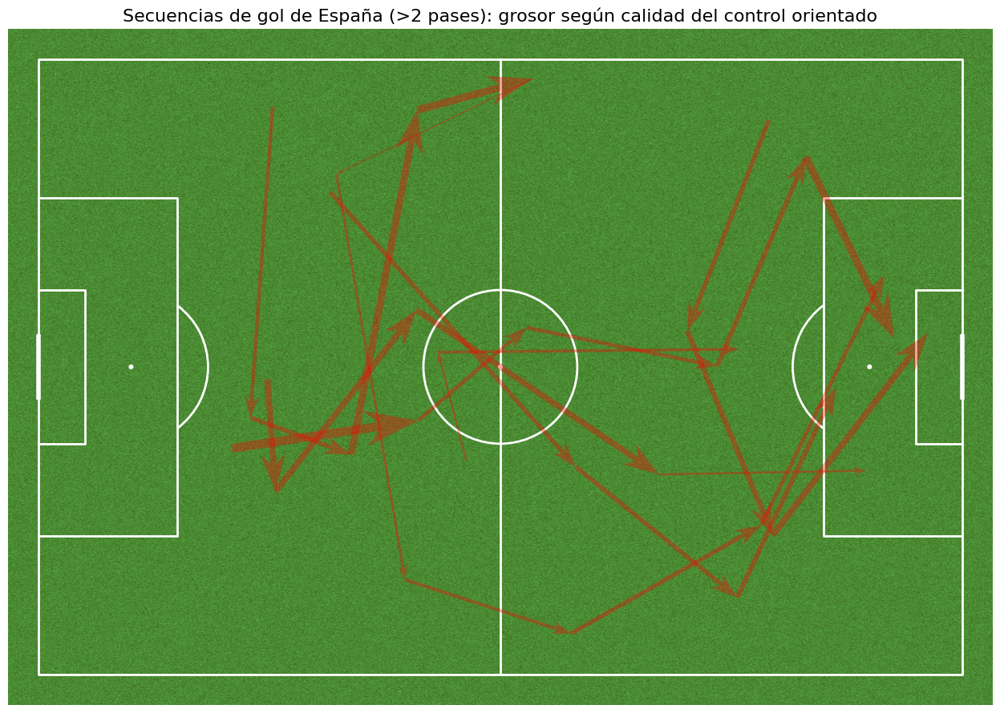

In [ ]:
# Filtrar solo secuencias de España y con más de dos pases
secuencias_espana = []
for key in set((s['match_id'], s['possession'], s['secuencia_id']) for s in secuencias_gol):
    pases = [s for s in secuencias_gol if (s['match_id'], s['possession'], s['secuencia_id']) == key]
    # Filtrar por equipo España y mínimo 3 pases
    if len(pases) > 2 and all(df[df['match_id'] == s['match_id']][df['timestamp'] == s['timestamp']]['team'].values[0] == 'Spain' for s in pases):
        secuencias_espana.append(pases)

# Normalizar la calidad del control para usar como grosor de línea
def normalize_control(control, min_width=1, max_width=8):
    control = np.nan_to_num(control, nan=np.nanmin(control))
    min_c, max_c = np.nanmin(control), np.nanmax(control)
    if max_c - min_c == 0:
        return np.full_like(control, min_width)
    return min_width + (control - min_c) / (max_c - min_c) * (max_width - min_width)

# Extraer todos los valores de control para normalizar después
all_controls = [s['control_orientado'] for seq in secuencias_espana for s in seq if not np.isnan(s['control_orientado'])]
all_controls = np.array(all_controls)
all_widths = normalize_control(all_controls)

# Crear el campo
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(14, 9))

width_idx = 0
for secuencia in secuencias_espana:
    for i in range(len(secuencia) - 1):
        pos_actual = secuencia[i]['posicion_control']
        pos_siguiente = secuencia[i+1]['posicion_control']
        # Convertir string a lista si es necesario
        if isinstance(pos_actual, str):
            try:
                pos_actual = eval(pos_actual)
            except Exception:
                continue
        if isinstance(pos_siguiente, str):
            try:
                pos_siguiente = eval(pos_siguiente)
            except Exception:
                continue
        control = secuencia[i]['control_orientado']
        if np.isnan(control):
            width = 1
        else:
            width = all_widths[width_idx]
            width_idx += 1
        pitch.arrows(
            pos_actual[0], pos_actual[1],
            pos_siguiente[0], pos_siguiente[1],
            ax=ax,
            color='red',
            alpha=0.35,
            width=width,
            headwidth=4,
            headlength=6,
            zorder=2
        )

ax.set_title('Secuencias de gol de España (>2 pases): grosor según calidad del control orientado', fontsize=16)
plt.show()

Cabe señalar que los controles que más valor aportan son aquellos realizados en campo propio, para dar inicio a la jugada. Puede ser que se deba a presiones altas de equipos de alto nivel, y a la calidad de los mediocentros de españa añadido al estilo de juego de la roja, que se centra en un estilo de posesion de atraer rivales para conseguir encontrar el espacio libre.

Por ejemplo, el control con mayor grosor se debe al de Fabian en la final contra inglaterra que inicia la secuencia de pases para hacer el segundo gol definitivo. Aqui fabian recibe un pase vertical de espaldas a la porteria y entre dos contrarios, pero consigue orientarse lateralizando su cuerpo antes de recibir el balón para, antes de que lleguen los rivales, poder controlar el balon y dejarlo perfecto para filtrar un balon diagonal a dani olmo. La definicion del control orientado en estado puro. (duda, se puede poner enlace a video?)

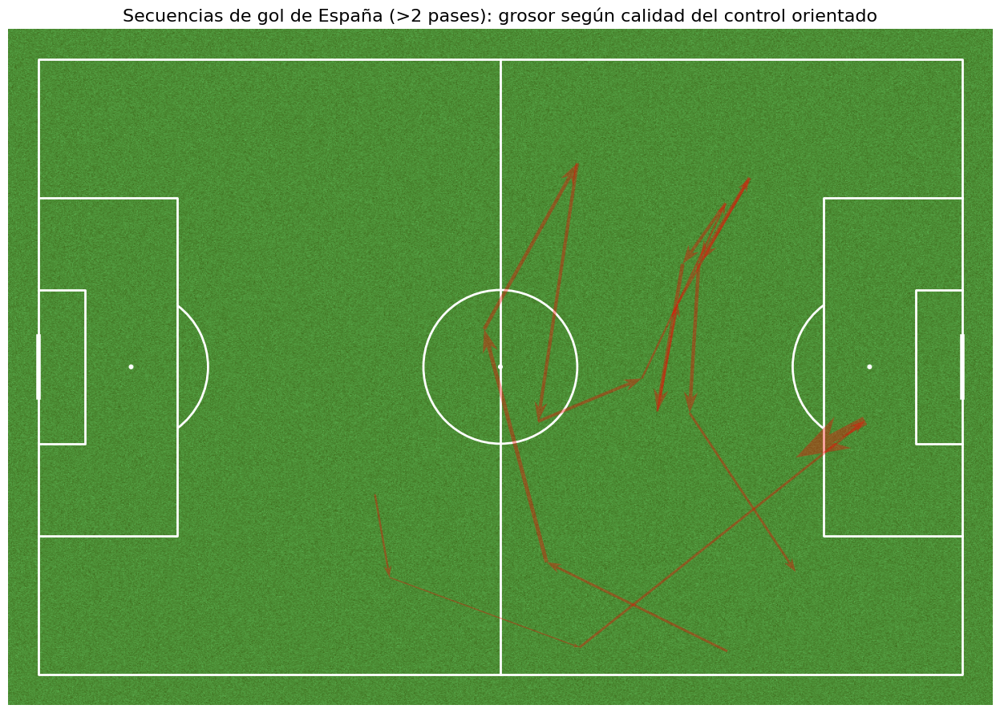

In [ ]:
# Filtrar solo secuencias de España y con más de dos pases
secuencias_espana = []
for key in set((s['match_id'], s['possession'], s['secuencia_id']) for s in secuencias_gol):
    pases = [s for s in secuencias_gol if (s['match_id'], s['possession'], s['secuencia_id']) == key]
    # Filtrar por equipo España y mínimo 3 pases
    if len(pases) > 2 and all(df[df['match_id'] == s['match_id']][df['timestamp'] == s['timestamp']]['team'].values[0] == 'England' for s in pases):
        secuencias_espana.append(pases)

# Normalizar la calidad del control para usar como grosor de línea
def normalize_control(control, min_width=1, max_width=8):
    control = np.nan_to_num(control, nan=np.nanmin(control))
    min_c, max_c = np.nanmin(control), np.nanmax(control)
    if max_c - min_c == 0:
        return np.full_like(control, min_width)
    return min_width + (control - min_c) / (max_c - min_c) * (max_width - min_width)

# Extraer todos los valores de control para normalizar después
all_controls = [s['control_orientado'] for seq in secuencias_espana for s in seq if not np.isnan(s['control_orientado'])]
all_controls = np.array(all_controls)
all_widths = normalize_control(all_controls)

# Crear el campo
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(14, 9))

width_idx = 0
for secuencia in secuencias_espana:
    for i in range(len(secuencia) - 1):
        pos_actual = secuencia[i]['posicion_control']
        pos_siguiente = secuencia[i+1]['posicion_control']
        # Convertir string a lista si es necesario
        if isinstance(pos_actual, str):
            try:
                pos_actual = eval(pos_actual)
            except Exception:
                continue
        if isinstance(pos_siguiente, str):
            try:
                pos_siguiente = eval(pos_siguiente)
            except Exception:
                continue
        control = secuencia[i]['control_orientado']
        if np.isnan(control):
            width = 1
        else:
            width = all_widths[width_idx]
            width_idx += 1
        pitch.arrows(
            pos_actual[0], pos_actual[1],
            pos_siguiente[0], pos_siguiente[1],
            ax=ax,
            color='red',
            alpha=0.35,
            width=width,
            headwidth=4,
            headlength=6,
            zorder=2
        )

ax.set_title('Secuencias de gol de España (>2 pases): grosor según calidad del control orientado', fontsize=16)
plt.show()